In [1]:
from experiments_frugality_inpainting import *

/users/eleves-b/2021/jeremie.touati/.local/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
INFO:datasets:PyTorch version 2.5.1 available.


# FILTERS 5x5

In [24]:
std_noise_train = 0.05
std_noise = 0.05
components_list = [10, 50] #[2, 10, 50] #[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 50, 100]
layers_list = [1]#, 20] #[1, 20]
n_rep_list = [1, 10, 100]#, 1000] #[1, 20, 50, 100]
denoiser_type_list = ["SD"] #, "SD"]
pth_kernel = "blur_models/blur_3.mat" #"blur_models/blur_1.mat"
img_list = [24] #[0, 4, 9, 12, 13]
n_iter_per_lambda = 200
n_lambda = 50
lambda_start = 10
lambda_end = 1e-5
eps_stop = 1e-6
warm_restart = True
save_path = "experiments/gloubiboulga/results.pkl"

params_model = {
        "kernel_size": 16,
        "lmbd": 1e-4,
        "color": COLOR,
        "device": DEVICE,
        "dtype": torch.float,
        "optimizer": "adam",
        "path_data": DATA_PATH,
        "max_sigma_noise": std_noise_train,
        "min_sigma_noise": std_noise_train,
        "mini_batch_size": 1,
        "max_batch": 10,
        "epochs": 50,
        "avg": False,
        "rescale": False,
        "fixed_noise": True,
        "D_shared": True,
        "step_size_scaling": 1.8,
        "lr": 1e-3,
        "dataset": DATASET,
    }

In [25]:
T_START = time.time()

DENOISERS = {"DRUNet": dict(model="drunet")}
DENOISERS["DRUNet"]["net"] = get_denoiser(**DENOISERS["DRUNet"])

for denoiser_type in denoiser_type_list:
    for components in components_list:
        for layers in layers_list:
            params = {k: v for k, v in params_model.items()}
            params["n_layers"] = layers
            params["n_components"] = components
            
            # ----- #REPEAT = #LAYERS -----
            if denoiser_type == "SD":
                base_name = f"SD_{components}C_{layers}L"
                model_type = "synthesis"
            elif denoiser_type == "AD":
                base_name = f"AD_{components}C_{layers}L"
                model_type = "analysis"
            
            name = f"{base_name}_{layers}R"
            DENOISERS[name] = {"model": model_type, **params}
            print(f"Training {base_name}...")
            DENOISERS[name]["net"] = get_denoiser(**DENOISERS[name])
            
            # ----- #REPEAT = 1 -----
            if layers > 1:
                denoiser = DENOISERS[name]
                old_net = denoiser["net"]
                net = UnrolledCDL(
                    type_unrolling=denoiser["model"],
                    **{k: v for k, v in denoiser.items() if k not in ["model", "net"]}
                ).unrolled_net
                # Replace the model with only the first layer of the trained model
                net.parameter = old_net.parameter
                net.model = torch.nn.ModuleList([old_net.model[0]])
                DENOISERS[f"{base_name}_1R"] = dict(net=net, model=denoiser["model"], **params)
                DENOISERS[f"{base_name}_1R"]["n_layers"] = 1
            
            # ----- #REPEAT = N_REP -----
            for n_rep in n_rep_list:
                if n_rep == layers:
                    continue
                denoiser = DENOISERS[f"{base_name}_1R"]
                old_net = denoiser["net"]
                net = UnrolledCDL(
                    type_unrolling=denoiser["model"],
                    **{k: v for k, v in denoiser.items() if k not in ["model", "net"]}
                ).unrolled_net
                assert len(net.model) == 1
                net.parameter = old_net.parameter
                net.model = torch.nn.ModuleList([old_net.model[0]] * n_rep)
                DENOISERS[f"{base_name}_{n_rep}R"] = dict(
                    net=net, model=denoiser["model"], **params
                )
                DENOISERS[f"{base_name}_{n_rep}R"]["n_layers"] = n_rep

print(f"\nSuccessfully prepared {len(DENOISERS.keys())} denoisers in {time.time() - T_START:.2f} seconds.")

Training SD_10C_1L...


Epoch 50 - Average train loss: 0.09320021 - Average test loss: 0.08696721: 100%|██████████| 50/50 [00:03<00:00, 13.88it/s]


Done
Training SD_50C_1L...


Epoch 50 - Average train loss: 0.09296022 - Average test loss: 0.08664563: 100%|██████████| 50/50 [00:06<00:00,  7.99it/s]

Done

Successfully prepared 7 denoisers in 10.10 seconds.


In [26]:
dataloader = create_dataloader(
    DATA_PATH,
    min_sigma_noise=std_noise,
    max_sigma_noise=std_noise,
    device=DEVICE,
    dtype=torch.float,
    mini_batch_size=1,
    train=False,
    color=COLOR,
    fixed_noise=True,
    crop=False,
)

In [27]:
img = dataloader.dataset[img_list[0]][1].cpu().numpy()
x_truth = img

In [28]:
Phi = np.random.rand(*img[0].shape) < 0.7
Phit = Phi

def Phi_channels(img, Phi):
    """
    Apply the mask Phi to img.
    """
    new_x = np.zeros_like(img)
    for i in range(img.shape[0]):
        new_x[i] = img[i] * Phi
    return new_x

gamma = 1.0
# Add noise to the observed image
img = np.clip(img + std_noise * np.random.randn(*img.shape), 0, 1)
x_observed = Phi_channels(img, Phi)

In [29]:
results = {
    "observation": x_observed,
    "truth": x_truth
}

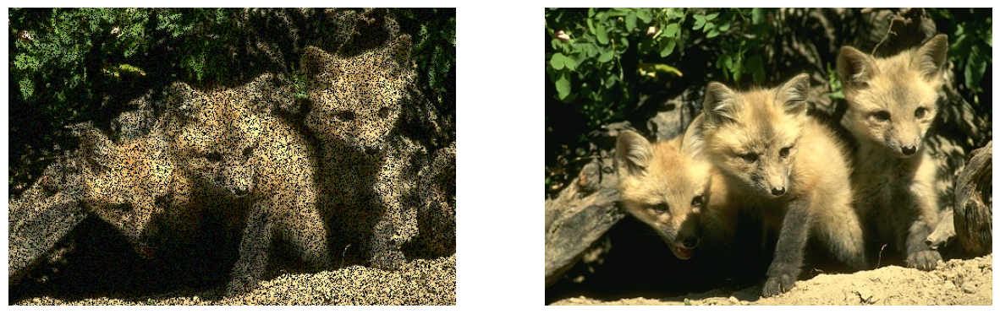

PSNR: 12.60 dB


/tmp/ipykernel_1362739/1417591989.py:14: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  print(f"PSNR: {peak_signal_noise_ratio(x_truth, x_observed.clip(0, 1)):.2f} dB")


In [8]:
def show_imgs(list_img, figsize=None, two_d=False):
    plt.figure(figsize=figsize)
    for i, img in enumerate(list_img):
        plt.subplot(1, len(list_img), i + 1)
        if two_d:
            img = img.squeeze()
        else:
            img = img.transpose(1, 2, 0)
        plt.imshow(img)
        plt.axis("off")
    plt.show()

show_imgs([x_observed.clip(0,1), x_truth], figsize=(15, 8))
print(f"PSNR: {peak_signal_noise_ratio(x_truth, x_observed.clip(0, 1)):.2f} dB")

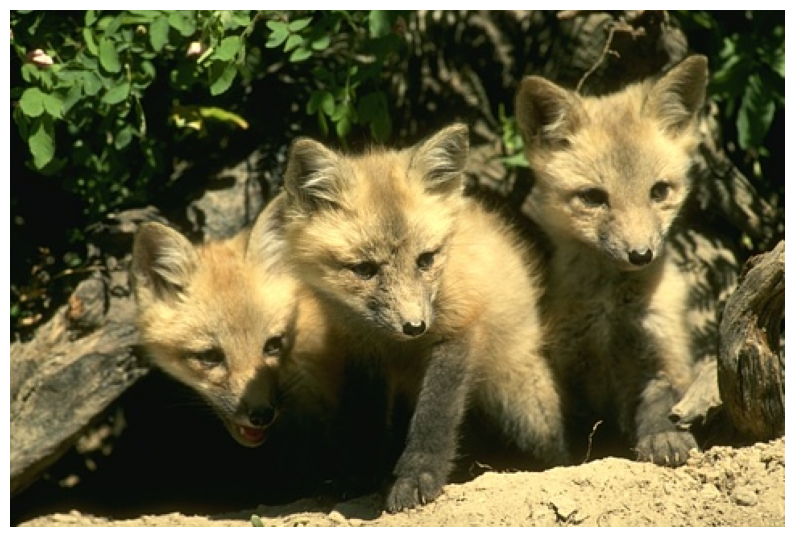

In [9]:
plt.figure(figsize=(10, 10))
plt.imshow(x_truth.transpose(1, 2, 0))
plt.axis('off')
plt.savefig(f"images_inpainting/truth.png", bbox_inches='tight')
plt.show()

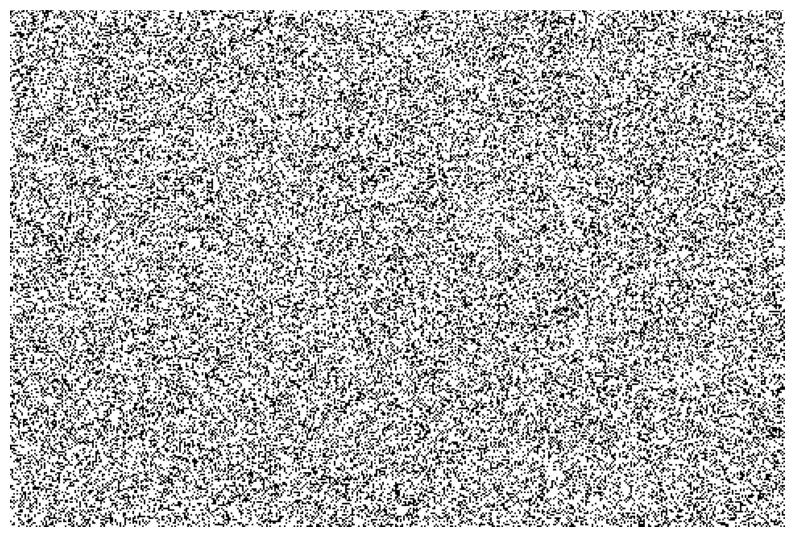

In [10]:
plt.figure(figsize=(10, 10))
plt.imshow(Phi, cmap='gray')
plt.axis('off')
plt.savefig(f"images_inpainting/mask.png", bbox_inches='tight')
plt.show()

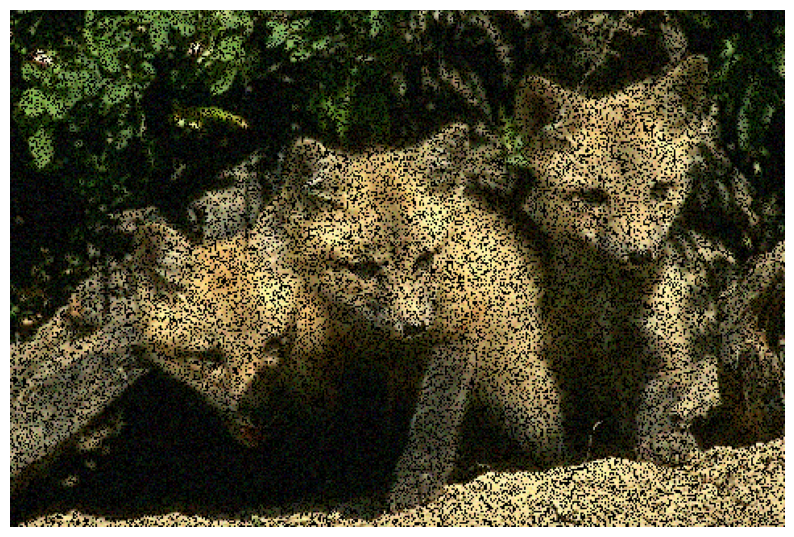

In [30]:
plt.figure(figsize=(10, 10))
plt.imshow(x_observed.transpose(1, 2, 0))
plt.axis('off')
plt.savefig(f"images_inpainting/x_observed.png", bbox_inches='tight')
plt.show()

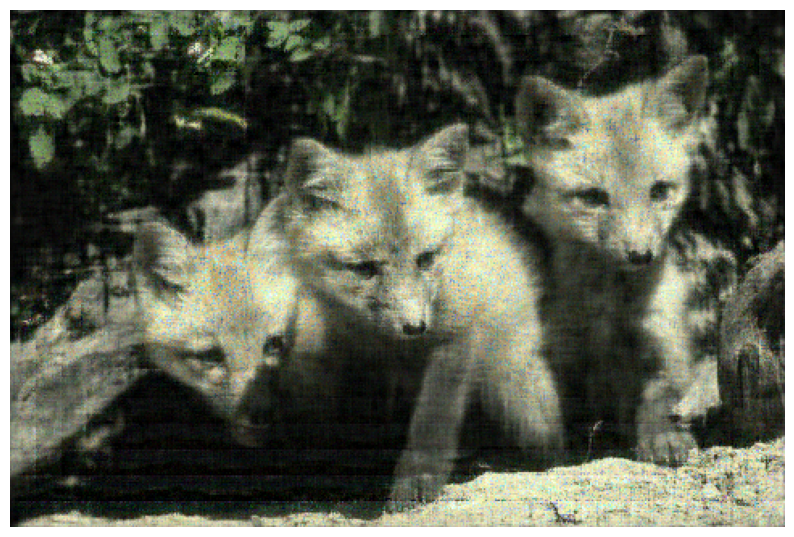

In [9]:
name_path = "SD_16K_50C_1L"

path_results = "convergence_inpainting/"+name_path+"/results_optimal_lambda.pkl"

with open(path_results, "rb") as f:
    list_results = pickle.load(f)
    img_denoised = list_results["best_x_psnr"]
    best_psnr = list_results["best_psnr"]
    current_dual = list_results["best_current_dual"]

# Show truth and save in "images/truth.png"
plt.figure(figsize=(10, 10))
plt.imshow(img_denoised.clip(0, 1).transpose(1, 2, 0))
plt.axis("off")
plt.savefig("images_inpainting/"+name_path+".png", bbox_inches="tight", pad_inches=0)

## Unbiasing: from $l_1$ to $l_2$

In [45]:
denoiser_names = ["SD_50C_1L_10R"]


Running denoiser: SD_50C_1L_10R


100%|██████████| 500/500 [01:39<00:00,  5.04it/s]


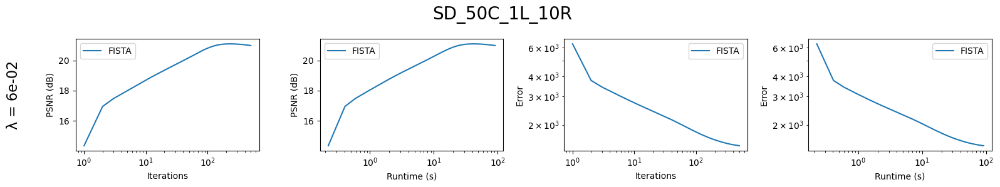

In [46]:
for denoiser_name in denoiser_names:
    
    print(f"\nRunning denoiser: {denoiser_name}")

    denoiser = DENOISERS[denoiser_name]
    net = denoiser["net"]
    model = "unrolled"
    
    lambdas = [5.85e-2]#1e-2, 1e-3, 1e-4]#, 1e-3, 1e-2]#, 1e-1] #[4.96e-2] #[1e-8] #[1e-2] #[1e-1] #[1e-2]#, 1e-3, 1e-4]
    n = len(lambdas)
    plt.figure(figsize=(16, 3*n))
    i = 0
    
    for best_lambda in lambdas:
        
        x_n = Phi_channels(x_observed, Phit)
        current_dual = None
        current_dual_fast = None

        iter_final = 500
        error_final = [0] * iter_final
        psnr_final = [0] * iter_final
        best_psnr = 0
        runtime_final = [0] * iter_final
        cvg_final = [0] * iter_final
        t_iter = 0
        update_dual = True

        for t in tqdm(range(iter_final)):
            
            t_start = time.perf_counter()

            g_n = Phi_channels((Phi_channels(x_n, Phi) - x_observed), Phit)
            tmp = x_n - gamma * g_n
            
            
            x_old = x_n.copy()
            alpha = t/(t+4)
            #alpha = 0
            x_n, current_dual, current_dual_fast = apply_model(
                model, tmp, current_dual, best_lambda, net, update_dual,
                fast=True, dual_fast=current_dual_fast, alpha_fast=alpha
            )

            t_iter += time.perf_counter() - t_start
            runtime_final[t] = t_iter
            cvg_final[t] = np.sum((x_n - x_old) ** 2)
            psnr_final[t] = peak_signal_noise_ratio(x_n, x_truth)
            error_final[t] = error_synthesis(current_dual[0], x_observed, net, Phi, best_lambda)
            
            if psnr_final[t] > best_psnr:
                best_x = x_n.copy()
                best_dual = current_dual.copy()
                best_psnr = psnr_final[t]
                
                
        plt.subplot(n, 4, 4*i+1)
        
        plt.text(-0.3, 0.5, f"λ = {best_lambda:.0e}", fontsize=16,
                 transform=plt.gca().transAxes, rotation=90,
                 verticalalignment='center', horizontalalignment='right')
        
        plt.semilogx(np.arange(1, iter_final + 1), psnr_final, label="FISTA")
        plt.xlabel("Iterations")
        plt.ylabel("PSNR (dB)")
        plt.legend()

        plt.subplot(n, 4, 4*i+2)
        plt.semilogx(runtime_final, psnr_final, label="FISTA")
        plt.xlabel("Runtime (s)")
        plt.ylabel("PSNR (dB)")
        plt.legend()

        plt.subplot(n, 4, 4*i+3)
        plt.loglog(np.arange(1, iter_final + 1), error_final, label="FISTA")
        plt.xlabel("Iterations")
        plt.ylabel("Error")
        plt.legend()

        plt.subplot(n, 4, 4*i+4)
        plt.loglog(runtime_final, error_final, label="FISTA")
        plt.xlabel("Runtime (s)")
        plt.ylabel("Error")
        plt.legend()
        
        i += 1

    plt.suptitle(f"{denoiser_name}", fontsize=20)
    plt.tight_layout()
    plt.show()

## All debiasing in one plot

In [47]:
support_z = current_dual != 0
support_z = torch.tensor(support_z, dtype=torch.float, device=DEVICE)
print(f"Proportion of zero elements in the dual: {np.mean(current_dual[0] == 0):.2%}")

parameter = net.parameter
iter_grad = 2000
step_size = gamma*1/net.compute_lipschitz()
step_size_x = gamma

lamb = 1e-5
lamb_x = 1e-1

# GRADIENT DESCENT ON x
# x_n_fast = x_n.copy()
x_n_fast = np.zeros_like(x_n)
w_n = x_n_fast.copy()
psnr_unbiased_fast_x = []
error_unbiased_fast_x = []
for i in tqdm(range(iter_grad)):
    old_x_n = x_n_fast.copy()
    grad = Phi_channels(w_n, Phi) - x_observed
    error_unbiased_fast_x.append(np.linalg.norm(grad))
    grad = Phi_channels(grad, Phit)
    w_n -= step_size_x * grad
    x_n_fast = w_n * (1/(1+lamb_x))
    alpha_i = i / (i + 4)
    w_n = x_n_fast + alpha_i * (x_n_fast - old_x_n)
    psnr_unbiased_fast_x.append(peak_signal_noise_ratio(x_truth, x_n_fast))

# GRADIENT DESCENT ON z
#z_n_fast = current_dual.copy()
z_n_fast = np.zeros_like(current_dual)
z_n_fast = torch.tensor(z_n_fast, device=DEVICE, dtype=torch.float)
w_n = z_n_fast.clone()
psnr_unbiased_fast = []
error_unbiased_fast = []
for i in tqdm(range(iter_grad)):
    old_z_n = z_n_fast.clone()
    grad = net.convt(w_n, net.parameter).detach().cpu().numpy()
    grad = Phi_channels(grad, Phi) - x_observed
    error_unbiased_fast.append(np.linalg.norm(grad))
    grad = Phi_channels(grad, Phit)
    grad = torch.tensor(grad, device=DEVICE, dtype=torch.float)
    grad = net.conv(grad, net.parameter)
    w_n -= step_size * grad
    z_n_fast = w_n * (1/(1+lamb))
    x_unbiased_fast = net.convt(z_n_fast, net.parameter).detach().cpu().numpy()[0]
    alpha_i = i / (i + 4)
    w_n = z_n_fast + alpha_i * (z_n_fast - old_z_n)
    psnr_unbiased_fast.append(peak_signal_noise_ratio(x_truth, x_unbiased_fast))

# PROJECTED GRADIENT DESCENT ON z
#z_n_proj_fast = current_dual.copy()
z_n_proj_fast = np.zeros_like(current_dual)
z_n_proj_fast = torch.tensor(z_n_proj_fast, device=DEVICE, dtype=torch.float)
w_n = z_n_proj_fast.clone()
psnr_unbiased_proj_fast = []
error_unbiased_proj_fast = []
for i in tqdm(range(iter_grad)):
    old_z_n = z_n_proj_fast.clone()
    grad = net.convt(w_n, net.parameter).detach().cpu().numpy()
    grad = Phi_channels(grad, Phi) - x_observed
    error_unbiased_proj_fast.append(np.linalg.norm(grad))
    grad = Phi_channels(grad, Phit)
    grad = torch.tensor(grad, device=DEVICE, dtype=torch.float)
    grad = net.conv(grad, net.parameter)
    w_n -= step_size * grad
    z_n_proj_fast = w_n * support_z * (1/(1+lamb))
    x_unbiased_proj_fast = net.convt(z_n_proj_fast, net.parameter).detach().cpu().numpy()[0]
    alpha_i = i / (i + 4)
    w_n = z_n_proj_fast + alpha_i * (z_n_proj_fast - old_z_n)
    psnr_unbiased_proj_fast.append(peak_signal_noise_ratio(x_truth, x_unbiased_proj_fast))

Proportion of zero elements in the dual: 94.63%


  0%|          | 0/2000 [00:00<?, ?it/s]

100%|██████████| 2000/2000 [00:51<00:00, 38.59it/s]


In [48]:
# Save the results
results = {
    "psnr_unbiased_fast_x": psnr_unbiased_fast_x,
    "psnr_unbiased_fast": psnr_unbiased_fast,
    "psnr_unbiased_proj_fast": psnr_unbiased_proj_fast,
    "x_n_fast": x_n_fast,
    "x_unbiased_fast": x_unbiased_fast,
    "x_unbiased_proj_fast": x_unbiased_proj_fast,
}
with open("images_inpainting/unbiasing_SD_16K_50C_1L.pkl", "wb") as f:
    pickle.dump(results, f)

### SD_5K_10C_1L

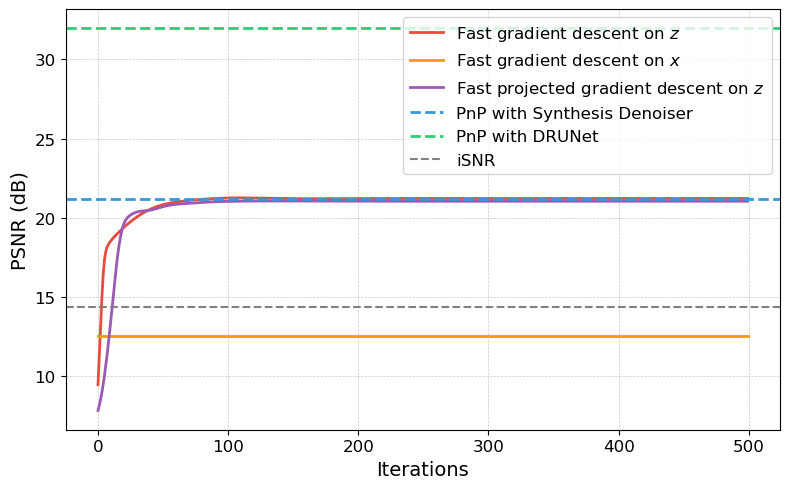

In [22]:
with open("images_inpainting/unbiasing_SD_5K_10C_1L.pkl", "rb") as f:
    results = pickle.load(f)
psnr_unbiased_fast_x = results["psnr_unbiased_fast_x"]
psnr_unbiased_fast = results["psnr_unbiased_fast"]
psnr_unbiased_proj_fast = results["psnr_unbiased_proj_fast"]

plt.figure(figsize=(8, 5))

# Sexy and modern color mapping
colors = {
    "drunet": "#2ecc71",     # Green
    "synthesis": "#3498db",  # Blue
    "proj_z": "#9b59b6",     # Purple
    "gd_x": "#f39c12",       # Orange
    "gd_z": "#e74c3c",       # Red
}

plt.plot(psnr_unbiased_fast, label=rf"Fast gradient descent on $z$", color=colors["gd_z"], linewidth=2)
plt.plot(psnr_unbiased_fast_x, label=rf"Fast gradient descent on $x$", color=colors["gd_x"], linewidth=2)
plt.plot(psnr_unbiased_proj_fast, label=rf"Fast projected gradient descent on $z$", color=colors["proj_z"], linewidth=2)

plt.axhline(21.16, linestyle='--', label="PnP with Synthesis Denoiser", color=colors["synthesis"], linewidth=2)
plt.axhline(31.98, linestyle='--', label="PnP with DRUNet", color=colors["drunet"], linewidth=2)
plt.axhline(14.38, linestyle='--', label="iSNR", color="grey")

plt.xlabel("Iterations", fontsize=14)
plt.ylabel("PSNR (dB)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.legend(fontsize=12)
plt.tight_layout()
plt.savefig("images_inpainting/unbiasing_SD_5K_10C_1L.pdf", bbox_inches="tight")
plt.show()

### SD_5K_50C_1L

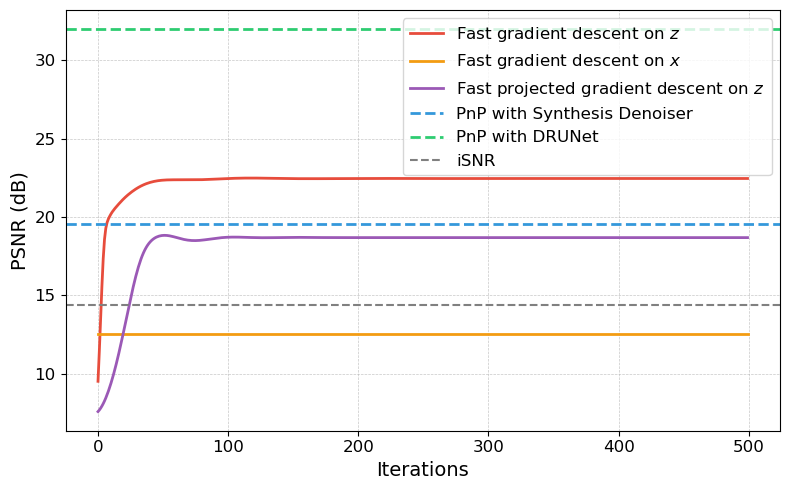

In [23]:
with open("images_inpainting/unbiasing_SD_5K_50C_1L.pkl", "rb") as f:
    results = pickle.load(f)
psnr_unbiased_fast_x = results["psnr_unbiased_fast_x"]
psnr_unbiased_fast = results["psnr_unbiased_fast"]
psnr_unbiased_proj_fast = results["psnr_unbiased_proj_fast"]

plt.figure(figsize=(8, 5))

# Sexy and modern color mapping
colors = {
    "drunet": "#2ecc71",     # Green
    "synthesis": "#3498db",  # Blue
    "proj_z": "#9b59b6",     # Purple
    "gd_x": "#f39c12",       # Orange
    "gd_z": "#e74c3c",       # Red
}

plt.plot(psnr_unbiased_fast, label=rf"Fast gradient descent on $z$", color=colors["gd_z"], linewidth=2)
plt.plot(psnr_unbiased_fast_x, label=rf"Fast gradient descent on $x$", color=colors["gd_x"], linewidth=2)
plt.plot(psnr_unbiased_proj_fast, label=rf"Fast projected gradient descent on $z$", color=colors["proj_z"], linewidth=2)

plt.axhline(19.53, linestyle='--', label="PnP with Synthesis Denoiser", color=colors["synthesis"], linewidth=2)
plt.axhline(31.98, linestyle='--', label="PnP with DRUNet", color=colors["drunet"], linewidth=2)
plt.axhline(14.38, linestyle='--', label="iSNR", color="grey")

plt.xlabel("Iterations", fontsize=14)
plt.ylabel("PSNR (dB)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.legend(fontsize=12)
plt.tight_layout()
plt.savefig("images_inpainting/unbiasing_SD_5K_50C_1L.pdf", bbox_inches="tight")
plt.show()

### SD_16K_10C_1L

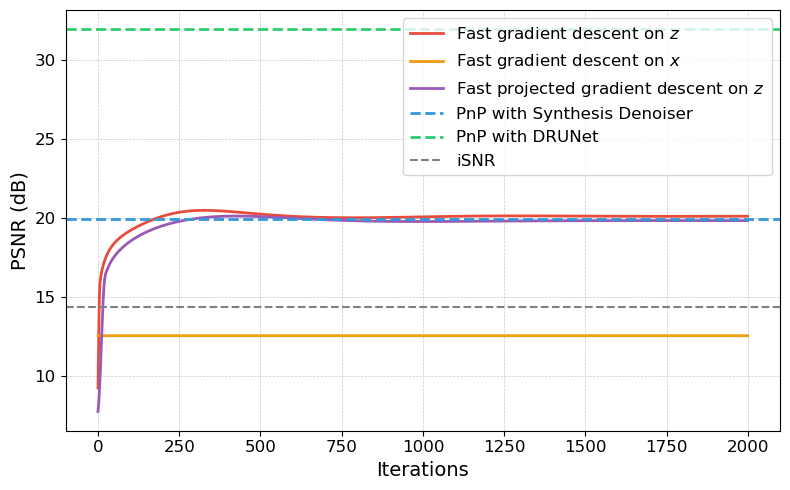

In [44]:
with open("images_inpainting/unbiasing_SD_16K_10C_1L.pkl", "rb") as f:
    results = pickle.load(f)
psnr_unbiased_fast_x = results["psnr_unbiased_fast_x"]
psnr_unbiased_fast = results["psnr_unbiased_fast"]
psnr_unbiased_proj_fast = results["psnr_unbiased_proj_fast"]

plt.figure(figsize=(8, 5))

# Sexy and modern color mapping
colors = {
    "drunet": "#2ecc71",     # Green
    "synthesis": "#3498db",  # Blue
    "proj_z": "#9b59b6",     # Purple
    "gd_x": "#f39c12",       # Orange
    "gd_z": "#e74c3c",       # Red
}

plt.plot(psnr_unbiased_fast, label=rf"Fast gradient descent on $z$", color=colors["gd_z"], linewidth=2)
plt.plot(psnr_unbiased_fast_x, label=rf"Fast gradient descent on $x$", color=colors["gd_x"], linewidth=2)
plt.plot(psnr_unbiased_proj_fast, label=rf"Fast projected gradient descent on $z$", color=colors["proj_z"], linewidth=2)

plt.axhline(19.96, linestyle='--', label="PnP with Synthesis Denoiser", color=colors["synthesis"], linewidth=2)
plt.axhline(31.98, linestyle='--', label="PnP with DRUNet", color=colors["drunet"], linewidth=2)
plt.axhline(14.38, linestyle='--', label="iSNR", color="grey")

plt.xlabel("Iterations", fontsize=14)
plt.ylabel("PSNR (dB)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.legend(fontsize=12)
plt.tight_layout()
plt.savefig("images_inpainting/unbiasing_SD_16K_10C_1L.pdf", bbox_inches="tight")
plt.show()

### SD_16K_50C_1L

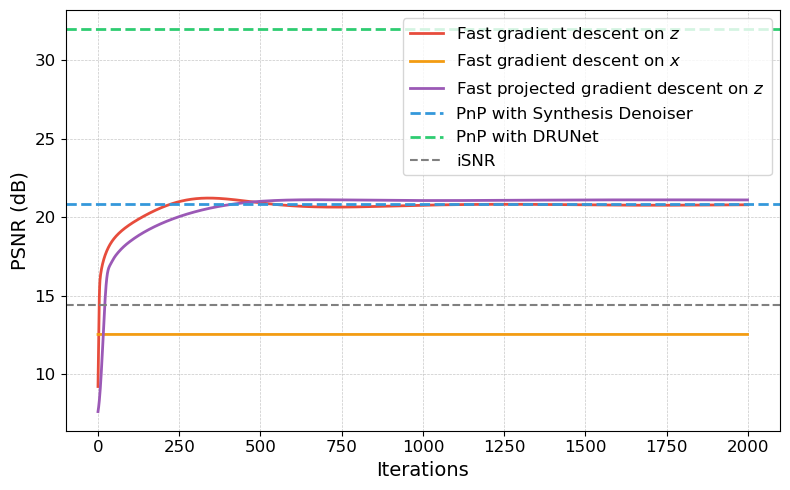

In [50]:
with open("images_inpainting/unbiasing_SD_16K_50C_1L.pkl", "rb") as f:
    results = pickle.load(f)
psnr_unbiased_fast_x = results["psnr_unbiased_fast_x"]
psnr_unbiased_fast = results["psnr_unbiased_fast"]
psnr_unbiased_proj_fast = results["psnr_unbiased_proj_fast"]

plt.figure(figsize=(8, 5))

# Sexy and modern color mapping
colors = {
    "drunet": "#2ecc71",     # Green
    "synthesis": "#3498db",  # Blue
    "proj_z": "#9b59b6",     # Purple
    "gd_x": "#f39c12",       # Orange
    "gd_z": "#e74c3c",       # Red
}

plt.plot(psnr_unbiased_fast, label=rf"Fast gradient descent on $z$", color=colors["gd_z"], linewidth=2)
plt.plot(psnr_unbiased_fast_x, label=rf"Fast gradient descent on $x$", color=colors["gd_x"], linewidth=2)
plt.plot(psnr_unbiased_proj_fast, label=rf"Fast projected gradient descent on $z$", color=colors["proj_z"], linewidth=2)

plt.axhline(20.81, linestyle='--', label="PnP with Synthesis Denoiser", color=colors["synthesis"], linewidth=2)
plt.axhline(31.98, linestyle='--', label="PnP with DRUNet", color=colors["drunet"], linewidth=2)
plt.axhline(14.38, linestyle='--', label="iSNR", color="grey")

plt.xlabel("Iterations", fontsize=14)
plt.ylabel("PSNR (dB)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
plt.legend(fontsize=12)
plt.tight_layout()
plt.savefig("images_inpainting/unbiasing_SD_16K_50C_1L.pdf", bbox_inches="tight")
plt.show()

In [31]:
support_z = current_dual != 0
support_z = torch.tensor(support_z, dtype=torch.float, device=DEVICE)
print(f"Proportion of zero elements in the dual: {np.mean(current_dual[0] == 0):.2%}")

Proportion of zero elements in the dual: 79.59%


  0%|          | 0/500 [00:00<?, ?it/s]

100%|██████████| 500/500 [00:02<00:00, 174.01it/s]


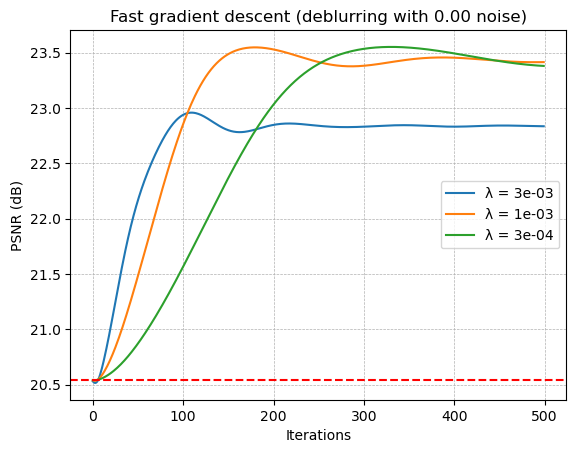

In [32]:
parameter = net.parameter

iter_grad = 500
step_size = gamma*1/net.compute_lipschitz()

plt.figure()
for lamb in [3e-3, 1e-3, 3e-4]: #1e-3, 3e-4]: # [1e-5, 3e-5, 1e-4, 3e-4, 1e-3, 3e-3, 1e-2, 3e-2, 1e-1]:
    z_n_fast = current_dual.copy()
    z_n_fast = torch.tensor(z_n_fast, device=DEVICE, dtype=torch.float)
    # set to zero
    #z_n_fast *= 0
    w_n = z_n_fast.clone()
    psnr_unbiased_fast = []
    error_unbiased_fast = []
    for i in tqdm(range(iter_grad)):
        old_z_n = z_n_fast.clone()
        grad = net.convt(w_n, net.parameter).detach().cpu().numpy()
        grad = Phi_channels(grad, Phi) - x_observed
        error_unbiased_fast.append(np.linalg.norm(grad))
        grad = Phi_channels(grad, Phit)
        grad = torch.tensor(grad, device=DEVICE, dtype=torch.float)
        grad = net.conv(grad, net.parameter)
        w_n -= step_size * grad
        z_n_fast = w_n * (1/(1+lamb))
        x_unbiased_fast = net.convt(z_n_fast, net.parameter).detach().cpu().numpy()[0]
        alpha_i = i / (i + 4)
        w_n = z_n_fast + alpha_i * (z_n_fast - old_z_n)
        psnr_unbiased_fast.append(peak_signal_noise_ratio(x_truth, x_unbiased_fast))
    
    plt.plot(psnr_unbiased_fast, label=f"λ = {lamb:.0e}")

plt.xlabel("Iterations")
plt.ylabel("PSNR (dB)")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend()
plt.title(f"Fast gradient descent (deblurring with {std_noise:.2f} noise)")
plt.axhline(psnr_final[-1], color='red', linestyle='--', label="SD")
plt.show()

(-0.5, 480.5, 320.5, -0.5)

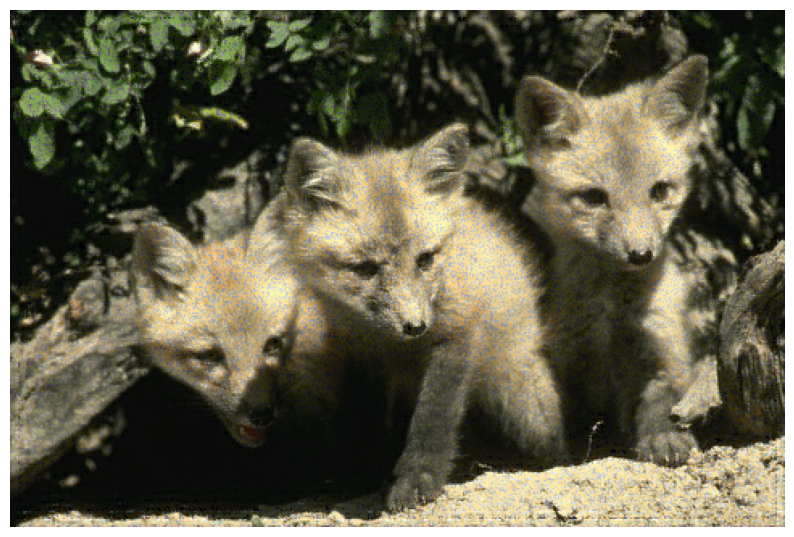

In [33]:
plt.figure(figsize=(10, 10))
plt.imshow(x_unbiased_fast.transpose(1, 2, 0))
plt.axis('off')

  0%|          | 0/500 [00:00<?, ?it/s]

100%|██████████| 500/500 [00:03<00:00, 136.28it/s]


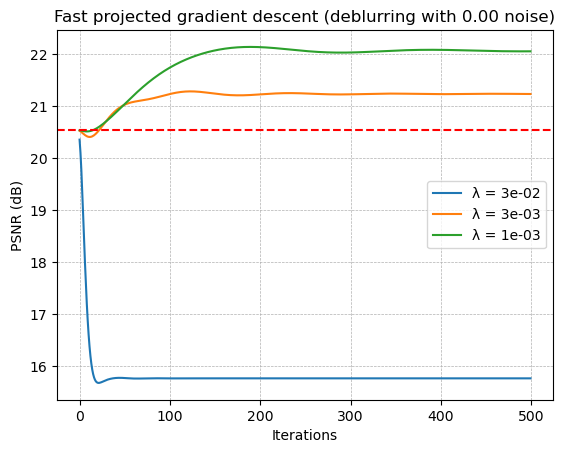

In [34]:
parameter = net.parameter

iter_grad = 500
step_size = gamma*1/net.compute_lipschitz()

plt.figure()
for lamb in [3e-2, 3e-3, 1e-3]: #, 3e-4]: #[1e-5, 3e-5, 1e-4, 3e-4, 1e-3, 3e-3, 1e-2, 3e-2, 1e-1]:

    z_n_proj_fast = current_dual.copy()
    z_n_proj_fast = torch.tensor(z_n_proj_fast, device=DEVICE, dtype=torch.float)
    w_n = z_n_proj_fast.clone()
    psnr_unbiased_proj_fast = []
    error_unbiased_proj_fast = []
    for i in tqdm(range(iter_grad)):
        old_z_n = z_n_proj_fast.clone()
        grad = net.convt(w_n, net.parameter).detach().cpu().numpy()
        grad = Phi_channels(grad, Phi) - x_observed
        error_unbiased_proj_fast.append(np.linalg.norm(grad))
        grad = Phi_channels(grad, Phit)
        grad = torch.tensor(grad, device=DEVICE, dtype=torch.float)
        grad = net.conv(grad, net.parameter)
        w_n -= step_size * grad
        z_n_proj_fast = w_n * support_z * (1/(1+lamb))
        x_unbiased_proj_fast = net.convt(z_n_proj_fast, net.parameter).detach().cpu().numpy()[0]
        alpha_i = i / (i + 4)
        w_n = z_n_proj_fast + alpha_i * (z_n_proj_fast - old_z_n)
        psnr_unbiased_proj_fast.append(peak_signal_noise_ratio(x_truth, x_unbiased_proj_fast))
    
    plt.plot(psnr_unbiased_proj_fast, label=f"λ = {lamb:.0e}")
    
plt.xlabel("Iterations")
plt.ylabel("PSNR (dB)")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend()
plt.title(f"Fast projected gradient descent (deblurring with {std_noise:.2f} noise)")
plt.axhline(psnr_final[-1], color='red', linestyle='--', label="SD")
plt.show()

(-0.5, 480.5, 320.5, -0.5)

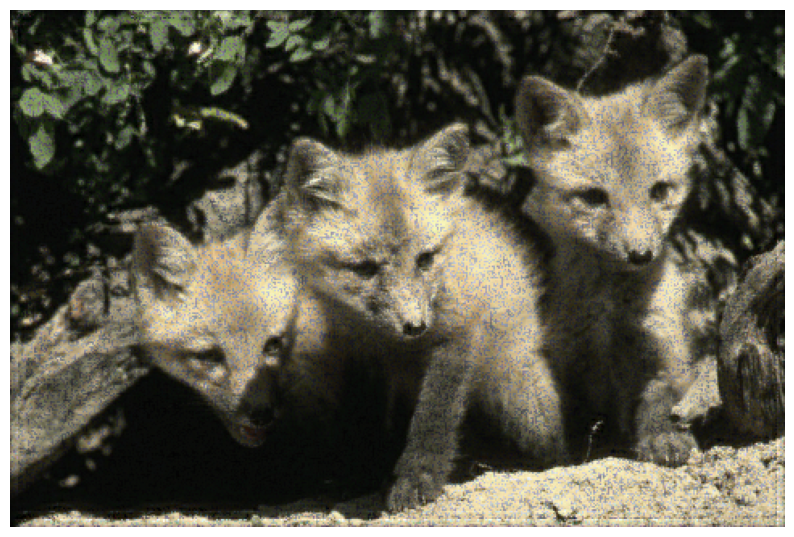

In [35]:
plt.figure(figsize=(10, 10))
plt.imshow(x_unbiased_proj_fast.transpose(1, 2, 0))
plt.axis('off')

## DRUNet

In [8]:
eps_stop = None
denoiser_name = "DRUNet"

denoiser = DENOISERS[denoiser_name]
net = denoiser["net"]
model = "drunet"
model_type = denoiser["model"]

  0%|          | 0/50 [00:00<?, ?it/s]

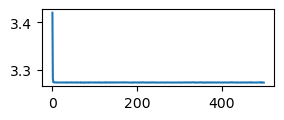

  2%|▏         | 1/50 [00:20<16:48, 20.59s/it]

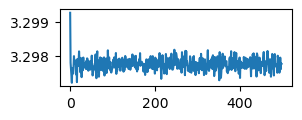

  4%|▍         | 2/50 [00:41<16:30, 20.64s/it]

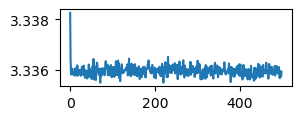

  6%|▌         | 3/50 [01:01<16:11, 20.67s/it]

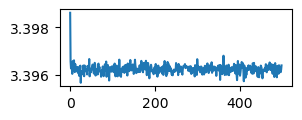

  8%|▊         | 4/50 [01:22<15:51, 20.68s/it]

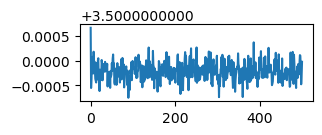

 10%|█         | 5/50 [01:43<15:31, 20.71s/it]

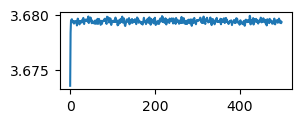

 12%|█▏        | 6/50 [02:04<15:11, 20.72s/it]

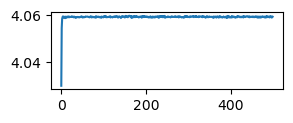

 14%|█▍        | 7/50 [02:24<14:51, 20.73s/it]

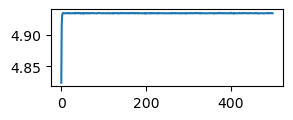

 16%|█▌        | 8/50 [02:45<14:30, 20.74s/it]

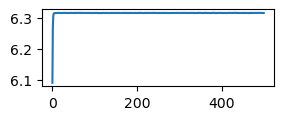

 18%|█▊        | 9/50 [03:06<14:11, 20.77s/it]

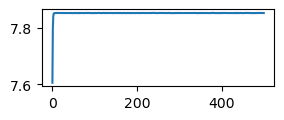

 20%|██        | 10/50 [03:27<13:51, 20.78s/it]

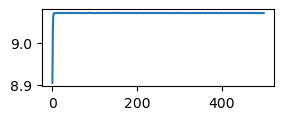

 22%|██▏       | 11/50 [03:48<13:31, 20.80s/it]

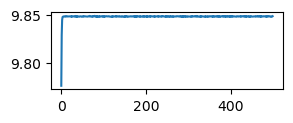

 24%|██▍       | 12/50 [04:08<13:09, 20.78s/it]

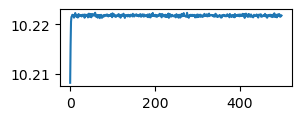

 26%|██▌       | 13/50 [04:29<12:48, 20.77s/it]

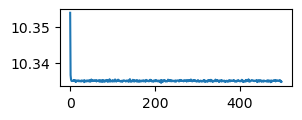

 28%|██▊       | 14/50 [04:50<12:27, 20.77s/it]

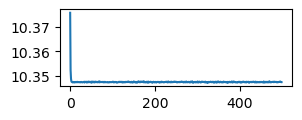

 30%|███       | 15/50 [05:11<12:07, 20.78s/it]

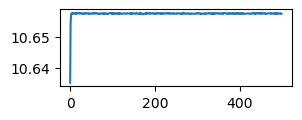

 32%|███▏      | 16/50 [05:32<11:46, 20.78s/it]

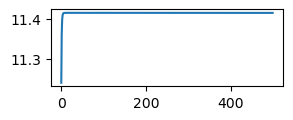

 34%|███▍      | 17/50 [05:52<11:25, 20.78s/it]

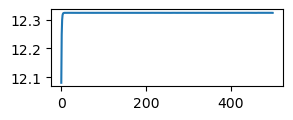

 36%|███▌      | 18/50 [06:13<11:04, 20.77s/it]

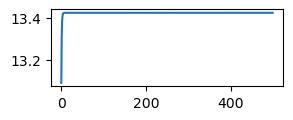

 38%|███▊      | 19/50 [06:34<10:44, 20.79s/it]

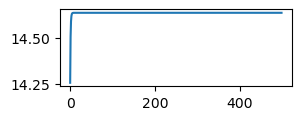

 40%|████      | 20/50 [06:55<10:22, 20.76s/it]

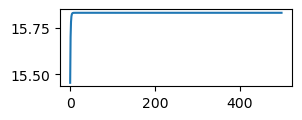

 42%|████▏     | 21/50 [07:15<10:01, 20.73s/it]

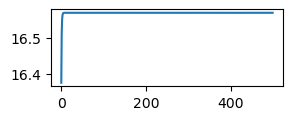

 44%|████▍     | 22/50 [07:36<09:39, 20.71s/it]

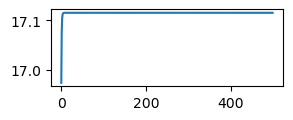

 46%|████▌     | 23/50 [07:57<09:19, 20.70s/it]

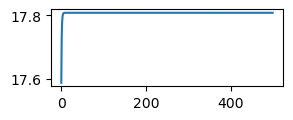

 48%|████▊     | 24/50 [08:17<08:58, 20.70s/it]

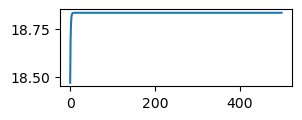

 50%|█████     | 25/50 [08:38<08:36, 20.68s/it]

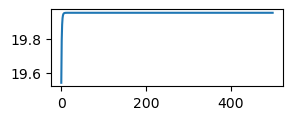

 52%|█████▏    | 26/50 [08:59<08:16, 20.68s/it]

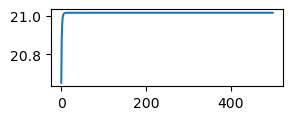

 54%|█████▍    | 27/50 [09:19<07:55, 20.69s/it]

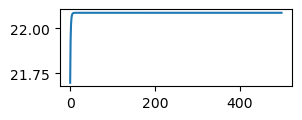

 56%|█████▌    | 28/50 [09:40<07:35, 20.68s/it]

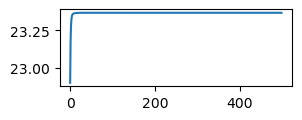

 58%|█████▊    | 29/50 [10:01<07:14, 20.67s/it]

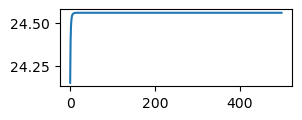

 60%|██████    | 30/50 [10:21<06:53, 20.68s/it]

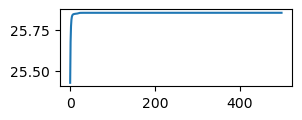

 62%|██████▏   | 31/50 [10:42<06:33, 20.69s/it]

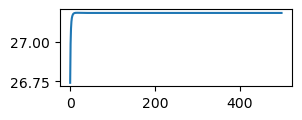

 64%|██████▍   | 32/50 [11:03<06:12, 20.68s/it]

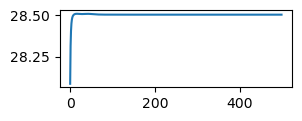

 66%|██████▌   | 33/50 [11:23<05:51, 20.68s/it]

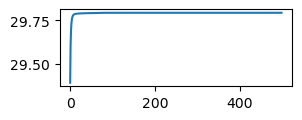

 68%|██████▊   | 34/50 [11:44<05:30, 20.68s/it]

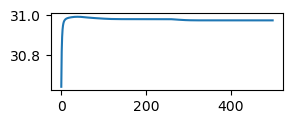

 70%|███████   | 35/50 [12:05<05:10, 20.68s/it]

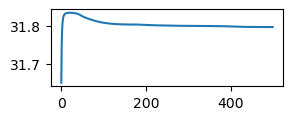

 72%|███████▏  | 36/50 [12:25<04:49, 20.68s/it]

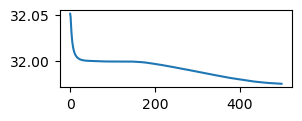

 74%|███████▍  | 37/50 [12:46<04:28, 20.69s/it]

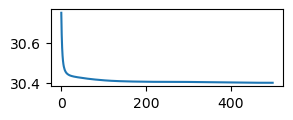

 76%|███████▌  | 38/50 [13:07<04:08, 20.72s/it]

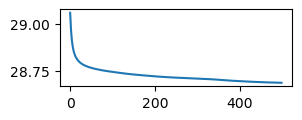

 78%|███████▊  | 39/50 [13:28<03:48, 20.73s/it]

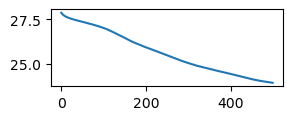

 80%|████████  | 40/50 [13:48<03:27, 20.75s/it]

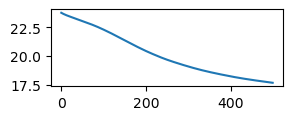

 82%|████████▏ | 41/50 [14:09<03:06, 20.75s/it]

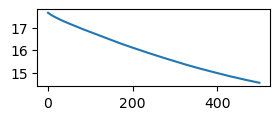

 84%|████████▍ | 42/50 [14:30<02:45, 20.74s/it]

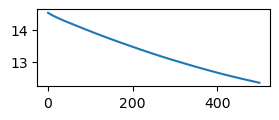

 86%|████████▌ | 43/50 [14:51<02:25, 20.74s/it]

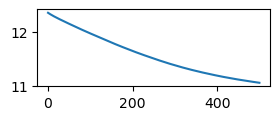

 88%|████████▊ | 44/50 [15:11<02:04, 20.74s/it]

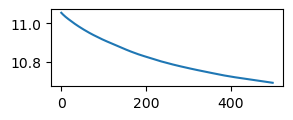

 90%|█████████ | 45/50 [15:32<01:43, 20.74s/it]

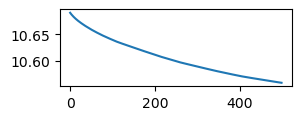

 92%|█████████▏| 46/50 [15:53<01:22, 20.73s/it]

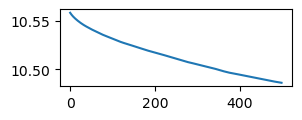

 94%|█████████▍| 47/50 [16:13<01:02, 20.72s/it]

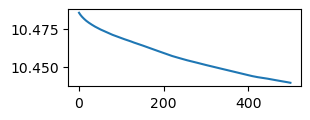

 96%|█████████▌| 48/50 [16:34<00:41, 20.71s/it]

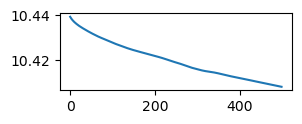

 98%|█████████▊| 49/50 [16:55<00:20, 20.70s/it]

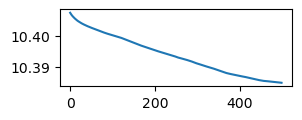

100%|██████████| 50/50 [17:16<00:00, 20.72s/it]


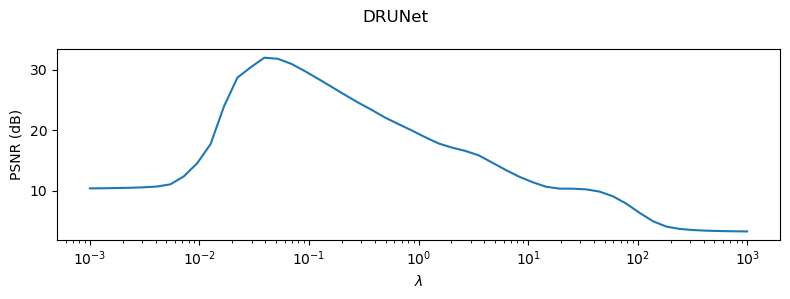

In [10]:
n_lambda = 50
lambda_list = np.logspace(np.log10(1e3), np.log10(1e-3), n_lambda)
n_iter_per_lambda = 500

n_lambda = len(lambda_list)
if lambda_list is None:
    lambda_list = [0.5 * std_noise] * n_lambda

x_n = Phi_channels(x_observed, Phit)
best_x_psnr = x_n.copy()
best_x_error = x_n.copy()
best_psnr = 0
best_error = 0
best_lambda = 0

cvg = [1e10] * n_lambda*n_iter_per_lambda
psnr = [0] * n_lambda
error = [0] * n_lambda
psnr_inner = [0] * n_lambda*n_iter_per_lambda
error_inner = [0] * n_lambda*n_iter_per_lambda
runtime = [0] * n_lambda*n_iter_per_lambda
stops = [0] * (n_lambda+1)

current_dual = None
current_dual_fast = None

best_current_dual, best_current_dual_fast = None, None

t_iter = 0

i = 0
for k in tqdm(range(n_lambda)):
    if not warm_restart:
        x_n = Phi_channels(x_observed, Phit)
        current_dual = None
        current_dual_fast = None
    
    for t in range(n_iter_per_lambda):
        t_start = time.perf_counter()
        g_n = Phi_channels((Phi_channels(x_n, Phi) - x_observed), Phit)
        tmp = x_n - gamma * g_n
        x_old = x_n.copy()

        x_n, current_dual = apply_model(
            model, tmp, current_dual, lambda_list[k], net, True
        )
        
        t_iter += time.perf_counter() - t_start
        cvg[i] = np.sum((x_n - x_old) ** 2)
        runtime[i] = t_iter
        psnr_inner[i] = peak_signal_noise_ratio(x_n, x_truth)
        criterion = np.sum((x_n - x_old) ** 2 / np.sum(x_old ** 2))
            
        if eps_stop is not None and criterion < eps_stop:
            break
        i += 1
    
    stops[k+1] = i
    
    if x_truth is not None:
        psnr[k] = psnr_inner[i-1]
        error[k] = error_inner[i-1]
        if psnr[k] > best_psnr:
            best_psnr = psnr[k]
            best_x_psnr = x_n.copy()
            best_lambda = lambda_list[k]
            bestb_current_dual = current_dual.copy() if current_dual is not None else None
            best_current_dual_fast = current_dual_fast.copy() if current_dual_fast is not None else None
        if error[k] < best_error:
            best_error = error[k]
            best_x_error = x_n.copy()
    
    plt.figure(figsize=(3, 1))
    plt.plot(psnr_inner[stops[k]:stops[k+1]])
    plt.show()

# Plot PSNR vs lambda and error vs lambda on 2 subplots
plt.figure(figsize=(8, 3))
plt.semilogx(lambda_list, psnr)
plt.xlabel(r"$\lambda$")
plt.ylabel("PSNR (dB)")
plt.suptitle(f"{denoiser_name}")
plt.tight_layout()
plt.show()

In [11]:
import os
if not os.path.exists("convergence_inpainting/DRUNet"):
    os.makedirs("convergence_inpainting/DRUNet")

with open(f"convergence_inpainting/DRUNet/results_optimal_lambda.pkl", "wb") as f:
    pickle.dump({
        "lambda_list": lambda_list,
        "psnr": psnr,
        "error": error,
        "psnr_inner": psnr_inner,
        "error_inner": error_inner,
        "runtime": runtime,
        "stops": stops,
        "best_x_psnr": best_x_psnr,
        "best_x_error": best_x_error,
        "best_lambda": best_lambda,
        "best_current_dual": best_current_dual,
        "best_current_dual_fast": best_current_dual_fast
    }, f)

/tmp/ipykernel_1175707/2866926416.py:22: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  isnr = peak_signal_noise_ratio(x_truth, x_observed)


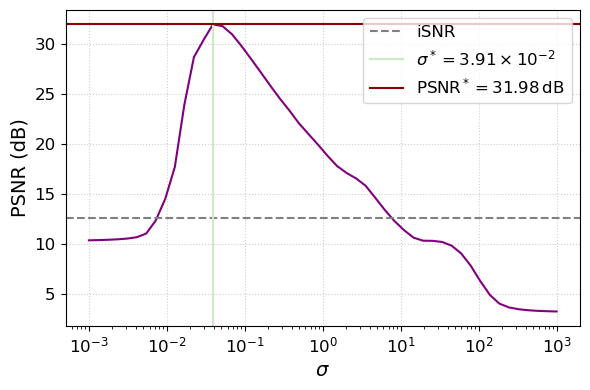

In [13]:
# Load .pkl file
with open(f"convergence_inpainting/DRUNet/results_optimal_lambda.pkl", "rb") as f:
    results = pickle.load(f)
lambda_list = results["lambda_list"]
psnr = results["psnr"]
error = results["error"]
psnr_inner = results["psnr_inner"]
error_inner = results["error_inner"]
runtime = results["runtime"]
stops = results["stops"]
best_x_psnr = results["best_x_psnr"]
best_x_error = results["best_x_error"]
best_lambda = results["best_lambda"]
best_current_dual = results["best_current_dual"]
best_current_dual_fast = results["best_current_dual_fast"]


significand = best_lambda / (10 ** np.floor(np.log10(best_lambda)))
exponent = int(np.floor(np.log10(best_lambda)))

colors = plt.get_cmap("Pastel1").colors
isnr = peak_signal_noise_ratio(x_truth, x_observed)

plt.figure(figsize=(6, 4))
plt.semilogx(lambda_list, psnr, color="purple")
plt.axhline(isnr, color='grey', linestyle='--', label='iSNR')
plt.axvline(
    best_lambda, color=colors[2], linewidth=1.5,
    label=rf"$\sigma^* = {significand:.2f} \times 10^{{{exponent}}}$"
)
plt.axhline(
    best_psnr, color="darkred", linewidth=1.5,
    label=rf"$\mathrm{{PSNR}}^* = {best_psnr:.2f}\,\mathrm{{dB}}$"
)

plt.xlabel(r"$\sigma$", fontsize=14)
plt.ylabel("PSNR (dB)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.savefig("convergence_inpainting/DRUNet/psnr_vs_lambda.pdf", bbox_inches='tight')

(-0.5, 480.5, 320.5, -0.5)

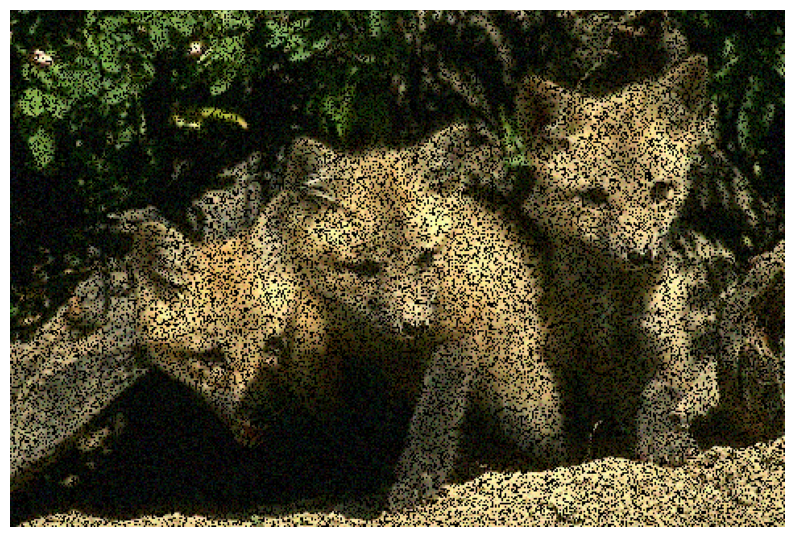

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(x_observed.transpose(1, 2, 0))
plt.axis('off')
#plt.savefig("images_inpainting/truth.png", bbox_inches='tight')

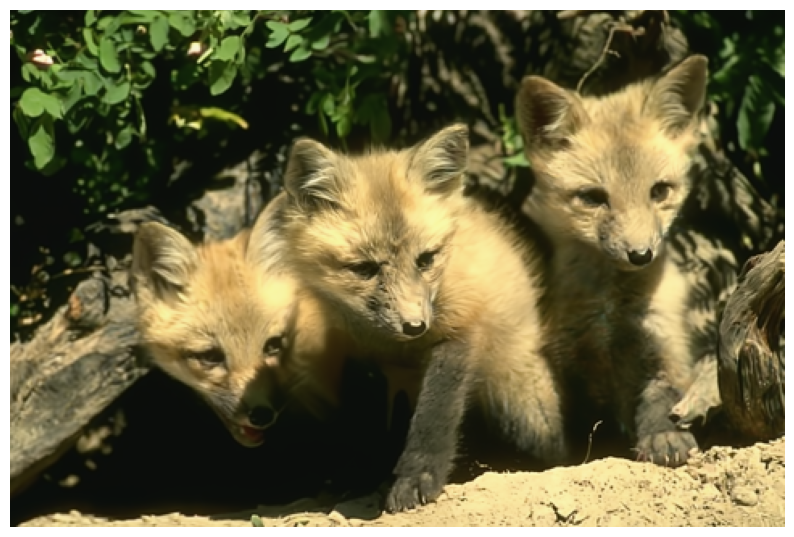

In [17]:
plt.figure(figsize=(10, 10))
plt.imshow(best_x_psnr.transpose(1, 2, 0))
plt.axis('off')
plt.savefig(f"images_inpainting/drunet.png", bbox_inches='tight')
plt.show()